In [1]:
#import libraries:
import pandas as pd
import numpy as np
import json
from geopy.geocoders import Nominatim
import requests
import matplotlib.cm as cm
import matplotlib.colors as colors
# import k-means from clustering stage
from sklearn.cluster import KMeans
#!pip install folium
import folium # map rendering library

In [114]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

As per an article written by [FinGlobal](https://www.finglobal.com/2020/09/02/how-many-south-africans-live-in-australia/):
    
> "As it turns out, psychology is very much at play when moving to a new country… Psychology tells us that as humans, we have an inbuilt need to belong. It’s not enough for us just to belong to this huge clan of “humans”, we actually want to have individualised belonging, which means we want to identify with specific groups of people in a population of humans. This comes into play quite evidently with emigration."

We can , thus, assume that many South Africans, when deciding where to imagrate, would chose a location that already has a big South African community in order to feel a sense of kinship and comfort. As well as a country that may be similar to theirs in terms of 

According to an article written by [The South African](https://www.thesouthafrican.com/lifestyle/south-africans-abroad/how-many-south-africans-are-living-abroad-and-where-have-they-decided-to-call-home/), approxamately 4.3 million South Africans have migrated to other countries during the 20th and 21st centuries.


According to [BISINESSTECH](https://businesstech.co.za/news/lifestyle/374332/skilled-south-africans-are-moving-to-these-6-countries/) the most common destinations for South African to move to are:


-  New Zealand
-    The United Kingdom
-    Australia
-    The USA
-    Germany
-    Switzerland



It will therefore, be determined which of these countries host the most South African immigrants

In [120]:
#create a df with the info found in order to plot data for reporting:

ppl = {'Country': ['The United Kingdom','New Zealand','Australia','The USA', 'Germany'],
        'Number': [246000 ,60000,189230,81000, 6090 ]
        }

df = pd.DataFrame(ppl, columns = ['Country', 'Number'])
df.set_index('Country', inplace=True)

print (df)

                    Number
Country                   
The United Kingdom  246000
New Zealand          60000
Australia           189230
The USA              81000
Germany               6090


#reputable source:

[South African in UK](http://news.bbc.co.uk/2/shared/spl/hi/uk/05/born_abroad/countries/html/south_africa.stm)


[South African in New Zealand](https://businesstech.co.za/news/lifestyle/342203/this-scary-graph-shows-how-many-south-africans-are-emigrating-to-new-zealand/)

#most up to date and reputable source:

[South African in Australia](https://www.homeaffairs.gov.au/research-and-statistics/statistics/country-profiles/profiles/south-africa)


[South African in Germany](https://www.thelocal.de/20190227/south-africans-in-germany-how-many-are-there-and-where-do-they-live)


[South African in Switzerland] - no available info


[South African in USA](https://en.wikipedia.org/wiki/South_African_Americans)

We don't know how accurate this data is or how reputable, therefore, the numbers for each country is only an estimation.

In [122]:
#sort values in df in desc order:
df.sort_values(['Number'], ascending=False, axis=0, inplace=True)

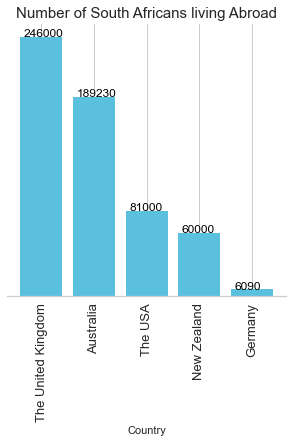

In [525]:
#plot:

#colour of bars:
c = ['#5bc0de']
#border around bars:
#plt.rcParams["patch.force_edgecolor"] = True
#teh plot:
ax = df.plot(kind = 'bar', figsize = (5, 5), width = 0.8, color = c)
plt.title('Number of South Africans living Abroad', fontsize = 15)
plt.xticks(fontsize = 13)
#plot count on bars:
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()+0.07, p.get_height()+50), fontsize=12, color='black')
    
    
#remove border lines from plot
ax.spines['right'].set_visible(False) 
ax.spines['top'].set_visible(False) 
ax.spines['left'].set_visible(False) 
plt.gca().axes.get_yaxis().set_visible(False)
#remove legend
ax.get_legend().remove()

We can see that the UK has the most South African immigrants, therefore, we will collect and use data for this country for our analysis.

### Gather data for UK:

- To gather the necessary data for the UK, we will need to scrape the web:
      - The best source to scrape from would be wikipedia

According to [BBC UK](http://news.bbc.co.uk/2/shared/spl/hi/uk/05/born_abroad/countries/html/south_africa.stm), the most popular areas in the UK for South Africans to reside are:
    
- Wimbledon N
- Putney E
- Putney W 	
- Golders Green 	
- Wimbledon S
- Richmond N
- Highgate
- Acton
- Fulham
- Kensington

These areas are in the London region, therefore, the data will be gathered from https://en.wikipedia.org/wiki/List_of_areas_of_London
as this page has geolocation data about all neighbourhoods in Londan that includes
- Location(area)
- London Borough
- Post town
- Postcode district

In [46]:
#gather data from wikipedia page:

df = pd.read_html('https://en.wikipedia.org/wiki/List_of_areas_of_London')[1]

In [56]:
#check the data:
df.head()

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [57]:
#rows and columns:
df.shape

(531, 6)

In [61]:
#missing data:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 531 entries, 0 to 530
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Location           531 non-null    object
 1   London borough     531 non-null    object
 2   Post town          531 non-null    object
 3   Postcode district  531 non-null    object
 4   Dial code          531 non-null    object
 5   OS grid ref        529 non-null    object
dtypes: object(6)
memory usage: 25.0+ KB


In [47]:
#we don't need the last 2 columns, we will drop them:
df.drop(df.columns[[4, 5]], axis = 1, inplace = True)

In [69]:
#test:
df.head()

,Location,London borough,Post town,Postcode district
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4"
2,Addington,Croydon[8],CROYDON,CR0
3,Addiscombe,Croydon[8],CROYDON,CR0
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14"


In [48]:
#rename columns for simplicity:
df.columns = ['location', 'borough', 'town', 'district']

In [74]:
#test:
df.columns

Index(['location', 'borough', 'town', 'district'], dtype='object')

In [49]:
#there are erroneous numerical characters after some borough names, this will be removed:

df['borough'] = df['borough'].str.rstrip(']').str.rstrip('0123456789').str.rstrip('[')

In [144]:
#test:
df.head()

,location,borough,town,district
0,Abbey Wood,"Bexley, Greenwich",LONDON,SE2
1,Acton,"Ealing, Hammersmith and Fulham",LONDON,"W3, W4"
2,Addington,Croydon,CROYDON,CR0
3,Addiscombe,Croydon,CROYDON,CR0
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14"


Because most South African move to London, we will only include the information for London

In [50]:
dfa = df[df.town.str.contains("LONDON")].reset_index(drop=True)

In [146]:
#test:
dfa.sample(10)

,location,borough,town,district
112,Gunnersbury,Hounslow,LONDON,W4
181,Mottingham,Bromley,LONDON,SE9
200,Paddington,Westminster,LONDON,W2
124,Harringay,Haringey,LONDON,"N4, N8, N15"
176,Mile End,Tower Hamlets,LONDON,E1
10,Bankside,Southwark,LONDON,SE1
259,Temple,"City, Westminster",LONDON,"EC4, WC2"
110,Grove Park,Hounslow,LONDON,W4
86,East Finchley,Barnet,LONDON,N2
107,Grahame Park,Barnet,LONDON,NW9


### Get geolocation for London

In [92]:
!pip install pgeocode

In [43]:
#from geopy.geocoders import Nominatim
import pgeocode

In [51]:

pgeocode.Nominatim('gb')
geolocator = pgeocode.Nominatim('gb')
postal_codes = dfa['district'].tolist()
latitudes = []
longitudes = []
for i, postal_code in enumerate(postal_codes):
    # initialize your variable to None
    #print(f'--Getting Postal Code: {postal_code}')
    g = geolocator.query_postal_code(postal_code)
    
    if not g.empty:
        print(f'district {postal_code} has been retrieved. {len(postal_codes) - (i + 1)} codes left')
        latitudes.append(g.latitude)
        longitudes.append(g.longitude)

district SE2 has been retrieved. 307 codes left
district W3, W4 has been retrieved. 306 codes left
district EC3 has been retrieved. 305 codes left
district WC2 has been retrieved. 304 codes left
district SE20 has been retrieved. 303 codes left
district EC1, N1 has been retrieved. 302 codes left
district N19 has been retrieved. 301 codes left
district EN5, NW7 has been retrieved. 300 codes left
district N11, N14 has been retrieved. 299 codes left
district SW12 has been retrieved. 298 codes left
district SE1 has been retrieved. 297 codes left
district EC1, EC2 has been retrieved. 296 codes left
district SW13 has been retrieved. 295 codes left
district NW7, EN5 has been retrieved. 294 codes left
district N1 has been retrieved. 293 codes left
district SW11 has been retrieved. 292 codes left
district W2 has been retrieved. 291 codes left
district BR3, SE20 has been retrieved. 290 codes left
district E6, E16, IG11 has been retrieved. 289 codes left
district W4 has been retrieved. 288 codes l

district N4 has been retrieved. 139 codes left
district E12 has been retrieved. 138 codes left
district E15 has been retrieved. 137 codes left
district W1 has been retrieved. 136 codes left
district W1 has been retrieved. 135 codes left
district SE10 has been retrieved. 134 codes left
district SW19 has been retrieved. 133 codes left
district SE9 has been retrieved. 132 codes left
district E1 has been retrieved. 131 codes left
district NW7 has been retrieved. 130 codes left
district SW1 has been retrieved. 129 codes left
district E14 has been retrieved. 128 codes left
district SW14 has been retrieved. 127 codes left
district SE9 has been retrieved. 126 codes left
district N10 has been retrieved. 125 codes left
district NW2, NW10 has been retrieved. 124 codes left
district SE14 has been retrieved. 123 codes left
district SE9 has been retrieved. 122 codes left
district N11 has been retrieved. 121 codes left
district SE1, SE17 has been retrieved. 120 codes left
district SW8 has been retrie

In [15]:
dfa['Latitude'] = latitudes
dfa['Longitude'] = longitudes

In [16]:
dfa.head(10)

,location,borough,town,district,Latitude,Longitude
0,Abbey Wood,"Bexley, Greenwich",LONDON,SE2,51.4869,0.107500
1,Acton,"Ealing, Hammersmith and Fulham",LONDON,"W3, W4",NaN,NaN
2,Aldgate,City,LONDON,EC3,51.5085,-0.125700
3,Aldwych,Westminster,LONDON,WC2,51.5142,-0.123382
4,Anerley,Bromley,LONDON,SE20,51.4065,-0.056950
5,Angel,Islington,LONDON,"EC1, N1",NaN,NaN
6,Archway,Islington,LONDON,N19,51.5649,-0.135100
7,Arkley,Barnet,"BARNET, LONDON","EN5, NW7",NaN,NaN
8,Arnos Grove,Enfield,LONDON,"N11, N14",NaN,NaN
9,Balham,Wandsworth,LONDON,SW12,51.4469,-0.138400


In [101]:
#There are missing values for lang and long:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308 entries, 0 to 307
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   location   308 non-null    object 
 1   borough    308 non-null    object 
 2   town       308 non-null    object 
 3   district   308 non-null    object 
 4   Latitude   253 non-null    float64
 5   Longitude  253 non-null    float64
dtypes: float64(2), object(4)
memory usage: 14.6+ KB


In [17]:
#drop missing values:
dfa.dropna(inplace=True)

In [18]:
dfa.shape

(253, 6)

In [19]:
#save df:
dfa.to_csv('london_location_data', index = False)

In [3]:
dfa = pd.read_csv('london_location_data')

### Gather data for Johannesburg:

According to [Stats sa](http://www.statssa.gov.za/?p=13453) The province of Gauteng has the largest population, with approximately 15,5 million people living here. We will then gather data for Johannesburg, which is the capital city of Gauteng.



  - This data will be abtained from www.blaauwberg.net where there is a publicly available database containg South African Postcode.
     - The data will be downloaded programmaticaly from a series of URLs.

In [4]:
a = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=f')[0]

In [5]:
a.head()

,0,1,2,3,4
0,Place Name,Street Code,PO Box Code,City,Province
1,FABRICIA,8301,NaN,KIMBERLEY,Nothern Cape
2,FACTORIA,1739,NaN,KRUGERSDORP,Gauteng
3,FACTRETON,7405,NaN,MAITLAND,Western Cape
4,FADIMEHANG,NaN,9788,BOTSHABELO,Free State


In [6]:
#fix structure of df:
new_header = a.iloc[0] #grab the first row for the header
a = a[1:] #take the data less the header row
a.columns = new_header #set the header row as the df header

In [7]:
#test:
a.head()

,Place Name,Street Code,PO Box Code,City,Province
1,FABRICIA,8301,NaN,KIMBERLEY,Nothern Cape
2,FACTORIA,1739,NaN,KRUGERSDORP,Gauteng
3,FACTRETON,7405,NaN,MAITLAND,Western Cape
4,FADIMEHANG,NaN,9788,BOTSHABELO,Free State
5,FAERIE GLEN,0081,0043,PRETORIA,Gauteng


In [37]:
a.shape

(387, 5)

In [8]:
#make function to fix headers:
def headers(df):
    new_header = df.iloc[0]
    df = df[1:] 
    df.columns = new_header
    return df

In [9]:
b = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=b')[0]

In [40]:
b.head()

,0,1,2,3,4
0,Place Name,Street Code,PO Box Code,City,Province
1,BAAKENS VALLEY,6001,NaN,NaN,Eastern Cape
2,BAARDSKEERDERSBOS,NaN,7271,GANS BAY,Western Cape
3,BABANANGO,NaN,3850,ESHOWE,Kwazulu Natal
4,BABELEGI,0407,0407,TEMBA,North West Province


In [10]:
#fix structure of df:
b = headers(b)

In [42]:
b.head()

,Place Name,Street Code,PO Box Code,City,Province
1,BAAKENS VALLEY,6001,NaN,NaN,Eastern Cape
2,BAARDSKEERDERSBOS,NaN,7271,GANS BAY,Western Cape
3,BABANANGO,NaN,3850,ESHOWE,Kwazulu Natal
4,BABELEGI,0407,0407,TEMBA,North West Province
5,BABETHU,NaN,0488,-,North West Province


In [11]:
c = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=c')[0]

In [12]:
#fix structure of df:
c = headers(c)

In [13]:
d = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=d')[0]
e = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=e')[0]
f = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=f')[0]
g = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=g')[0]
h = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=h')[0]
i = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=i')[0]
j = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=j')[0]
k = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=k')[0]
l = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=l')[0]
m = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=m')[0]
n = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=n')[0]
o = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=o')[0]
p = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=p')[0]
q = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=q')[0]
r = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=r')[0]
s = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=s')[0]
t = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=t')[0]
u = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=u')[0]
v = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=v')[0]
w = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=w')[0]
x = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=x')[0]
y = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=y')[0]
z = pd.read_html('http://www.blaauwberg.net/postalcodes_results.php?value=z')[0]

In [14]:
#fix structure of df:
d = headers(d)
e = headers(e)
f = headers(f)
g = headers(g)
h = headers(h)
i = headers(i)
j = headers(j)
k = headers(k)
l = headers(l)
m = headers(m)
n = headers(n)
o = headers(o)
p = headers(p)
q = headers(q)
r = headers(r)
s = headers(s)
t = headers(t)
u = headers(u)
v = headers(v)
w = headers(w)
x = headers(x)
y = headers(y)
z = headers(z)

In [15]:
#merge all dfs:
dfs = [a, b, c, d, e, f, g, h, i, j, k, l, m, n, o, p, q, r, s, t, u, v, q, w, y, z]
df2 = pd.concat(dfs)

In [16]:
#size of df:
df2.shape

(16687, 5)

In [17]:
#make copy:
dfj = df2.copy()

In [18]:
#test:
dfj.head()

,Place Name,Street Code,PO Box Code,City,Province
1,FABRICIA,8301,NaN,KIMBERLEY,Nothern Cape
2,FACTORIA,1739,NaN,KRUGERSDORP,Gauteng
3,FACTRETON,7405,NaN,MAITLAND,Western Cape
4,FADIMEHANG,NaN,9788,BOTSHABELO,Free State
5,FAERIE GLEN,0081,0043,PRETORIA,Gauteng


In [73]:
dfj[dfj['Place Name'] == 'GERMISTON']

,Place Name,Street Code,PO Box Code,City,Province
233,GERMISTON,1401,1400,-,Gauteng


In [74]:

dfj[(dfj['City'].isna()) | (dfj['Province'] == 'Gauteng')]

,Place Name,Street Code,PO Box Code,City,Province
2,FACTORIA,1739,NaN,KRUGERSDORP,Gauteng
5,FAERIE GLEN,0081,0043,PRETORIA,Gauteng
6,FAERIE GLEN EXT 2,0081,0043,FAERIE GLEN,Gauteng
7,FAERIE GLEN EXT 24,0081,0043,FAERIE GLEN,Gauteng
8,FAERIE GLEN EXT 3,0081,NaN,FAERIE GLEN,Gauteng
9,FAERIE GLEN EXT 32,0081,0043,FAERIE GLEN,Gauteng
10,FAERIE GLEN EXT 34,0081,NaN,FAERIE GLEN,Gauteng
11,FAERIE GLEN EXT 37,0081,0043,FAERIE GLEN,Gauteng
12,FAERIE GLEN EXT 4,0081,0043,FAERIE GLEN,Gauteng
13,FAERIE GLEN EXT 48,0081,0043,FAERIE GLEN,Gauteng


#### Clean the johanessburg dataset:
- we only want the postal codes that belong to Joburg, the records tht do not will be dropped.
- the missing data will be dropped.

There are some suburb names that have been used for "City" instead of Johannesburg. This will have to be fixed. These are:
- Boksburg,

- Benoni,

- Germiston,

- Alberton,

- Springs,

- Bedfordview,

- Bramely,

- Daveyton,

- Fourways,

- Jeppestown,

- Kempton Park, 

- Dududza,

- Bromhof,

- Dobsonville,

- Brakpan,

- Bryanston,

- Alrode,

- Edenvale,

- Katlehong,

- Tsakane,

- Pimville,

- Lenasia,

- Midrand,

- Florida,

- Primrose,

- Dalpark,

- Meadowlands,

- Kwenzekile,

- Rusloo,

- Tshiawelo,

- Orange Farm,

- Dube,

- Tembisa,

- Elandsfontein,

- Eldoradopark,

- Naledi,

- Ennerdale,

- Orlando


- Make a copy of city col, and rename initial city col to suburb and then only run the codes to replace incorrect cities with joburg.

In [176]:
#del(dfj['ity_new'])

In [19]:
#create new column:
dfj.insert(3, "suburb", dfj['City'])

In [20]:
#Test:
dfj.head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province
1,FABRICIA,8301,NaN,KIMBERLEY,KIMBERLEY,Nothern Cape
2,FACTORIA,1739,NaN,KRUGERSDORP,KRUGERSDORP,Gauteng


In [21]:
#replace values:
dfj['City'] = dfj['City'].replace(['BOKSBURG', 'BENONI', 'ALBERTON', 'GERMISTON', 'SPRINGS', 'BEDFORDVIEW', 'BRAMELY', 
                                  'DAVEYTON', 'FOURWAYS', 'JEPPESTOWN', 'KEMPTON PARK', 'DUDUDZA', 'BROMHOF', 'DOBSONVILLE', 
                                  'BRAKPAN', 'BRYANSTON', 'ALRODE', 'EDENVALE', 'KATLEHONG', 'TSAKANE', 'PIMVILLE', 'LENASIA',
                                  'MIDRAND', 'FLORIDA', 'PRIMROSE', 'DALPARK', 'MEADOWLANDS', 'KWENZEKILE', 'RUSLOO', 'TSHIAWELO',
                                  'ORANGE FARM', 'DUBE', 'TEMBISA', 'ELANDSFONTEIN', 'ELDORADOPARK', 'NALEDI', 'ENNERDALE',
                                   'ORLANDO'], 'JOHANNESBURG')

In [22]:
#test:
dfj.sample(8)

,Place Name,Street Code,PO Box Code,suburb,City,Province
916,ROSETTENVILLE EXT,2190,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng
494,SHARONLEA EXT 20,2194,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng
282,GLEBELAND,7234,NaN,-,-,Western Cape
71,SALDANHA RIF,7395,NaN,SALDANHA,SALDANHA,Western Cape
632,PRIESKA UIT 15,8940,NaN,PRIESKA,PRIESKA,Nothern Cape
109,MAGALIES VIEW EXT 17,NaN,2067,MAGALIES VIEW,MAGALIES VIEW,Gauteng
143,INDUSTRIELE GEBIED,3815,NaN,ESHOWE,ESHOWE,Kwazulu Natal
64,CARENVALE,1724,NaN,ROODEPOORT,ROODEPOORT,Gauteng


In [24]:
#test:
pd.set_option("max_rows", None) # see all rows in output
dfj[dfj.suburb == 'GERMISTON']

,Place Name,Street Code,PO Box Code,suburb,City,Province
157,FISHER'S HILL,1401,1408,GERMISTON,JOHANNESBURG,Gauteng
146,BARVALLEN,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng
127,CASTLEVIEW,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng
641,CRUYWAGENPARK,1428,NaN,GERMISTON,JOHANNESBURG,Gauteng
197,DE WITTSRUS,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng
251,DELMENVILLE,1401,1403,GERMISTON,JOHANNESBURG,Gauteng
252,DELMORE,1401,1404,GERMISTON,JOHANNESBURG,Gauteng
263,DELVILLE,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng
264,DELVILLE EXT 9,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng
266,DELVILLE SOUTH,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng


In [25]:
dfj.shape

(16687, 6)

In [26]:
# only joburg records:
dfj = dfj[dfj.City == "JOHANNESBURG"].reset_index(drop=True)

In [27]:
#test:
dfj.sample(15)

,Place Name,Street Code,PO Box Code,suburb,City,Province
1509,GLENMARAIS UIT 53,1619,NaN,KEMPTON PARK,JOHANNESBURG,Gauteng
2575,ORCHARDS UIT 13,2192,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng
10,FAIRVALE UIT 1,2192,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng
3462,SUNNINGHILL UIT 33,2191,2157,JOHANNESBURG,JOHANNESBURG,Gauteng
3928,WHITE CITY,1809,NaN,PIMVILLE,JOHANNESBURG,Gauteng
154,BARDENE UIT 13,1459,NaN,BOKSBURG,JOHANNESBURG,Gauteng
3939,WIERDA VALLEY,2196,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng
3262,SHARONLEA EXT 20,2194,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng
2462,NORTHWOLD EXT 12,2188,2155,JOHANNESBURG,JOHANNESBURG,Gauteng
3621,TSAKANE UIT 4,1550,NaN,TSAKANE,JOHANNESBURG,Gauteng


In [28]:
#test:
dfj.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4009 entries, 0 to 4008
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Place Name   4009 non-null   object
 1   Street Code  3842 non-null   object
 2   PO Box Code  1147 non-null   object
 3   suburb       4009 non-null   object
 4   City         4009 non-null   object
 5   Province     4009 non-null   object
dtypes: object(6)
memory usage: 188.0+ KB


In [29]:
#drop missing data, we need the records for street code to obtain the geolocation:
dfj.dropna(subset = ['Street Code'], axis = 0, inplace=True)

In [30]:
#test:
dfj.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3842 entries, 0 to 4008
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Place Name   3842 non-null   object
 1   Street Code  3842 non-null   object
 2   PO Box Code  980 non-null    object
 3   suburb       3842 non-null   object
 4   City         3842 non-null   object
 5   Province     3842 non-null   object
dtypes: object(6)
memory usage: 210.1+ KB


In [59]:
dfj.shape

(3842, 6)

In [64]:
dfj.head()

,Place Name,Street Code,PO Box Code,suburb,City,Province
14,FARRAR PARK,1459,NaN,BOKSBURG,JOHANNESBURG,Gauteng
15,FARRARMERE,1501,1518,BENONI,JOHANNESBURG,Gauteng
16,FARRARMERE EXT,1501,NaN,BENONI,JOHANNESBURG,Gauteng
17,FARRARMERE EXT 10,1501,NaN,BENONI,JOHANNESBURG,Gauteng
18,FARRARMERE EXT 16,1501,NaN,BENONI,JOHANNESBURG,Gauteng


In [67]:
dfj.info() #new smaller data set to test if venue gathering will work

<class 'pandas.core.frame.DataFrame'>
Int64Index: 384 entries, 15 to 4001
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Place Name   384 non-null    object
 1   Street Code  384 non-null    object
 2   PO Box Code  384 non-null    object
 3   suburb       384 non-null    object
 4   City         384 non-null    object
 5   Province     384 non-null    object
dtypes: object(6)
memory usage: 21.0+ KB


In [42]:
#save df to csv:
dfj.to_csv('joburg_location_data', index = False)

In [27]:
#drop dups to get locations:
#dfj.drop_duplicates(subset = 'Street Code', inplace = True)

In [44]:
#dfj.fillna("", inplace = True)

### Get geolocation for Johannesburg.

#### > Bellow code not working:

In [47]:
#pgeocode.Nominatim('za')
#geolocator = pgeocode.Nominatim('za')
#postal_codes = dfj['Street Code'].tolist()
#latitudes = []
#longitudes = []
#for i, postal_code in enumerate(postal_codes):
#    # initialize your variable to None
#    #print(f'--Getting Postal Code: {postal_code}')
#    g = geolocator.query_postal_code(postal_code)
#    
#    if not g.empty:
#        print(f'district {postal_code} has been retrieved. {len(postal_codes) - (i + 1)} codes left')
#        latitudes.append(g.latitude)
#        longitudes.append(g.longitude)

In [ ]:
#dfj['Latitude'] = latitudes
#dfj['Longitude'] = longitudes

#### > Using arcgis library instead:

In [119]:
!pip install arcgis

  Using cached jupyterlab_widgets-1.0.0-py3-none-any.whl (243 kB)
  Using cached pyshp-2.1.3-py3-none-any.whl
  Using cached lerc-0.1.0-py3-none-any.whl
  Using cached python_certifi_win32-1.6-py2.py3-none-any.whl (7.2 kB)
  Using cached requests_kerberos-0.12.0-py2.py3-none-any.whl (14 kB)
  Using cached winkerberos-0.7.0-cp37-cp37m-win_amd64.whl (19 kB)
  Using cached requests_negotiate_sspi-0.5.2-py2.py3-none-any.whl (7.1 kB)
  Using cached pypiwin32-223-py3-none-any.whl (1.7 kB)
  Using cached requests_ntlm-1.1.0-py2.py3-none-any.whl (5.7 kB)
  Using cached ntlm_auth-1.5.0-py2.py3-none-any.whl (29 kB)
  Using cached requests_toolbelt-0.9.1-py2.py3-none-any.whl (54 kB)
  Using cached setuptools_scm-5.0.1-py2.py3-none-any.whl (28 kB)


  Created wheel for arcgis: filename=arcgis-1.8.4-py2.py3-none-any.whl size=3199049 sha256=6727a609b81e932c752b9311258726f485ff193a06c4eca427a83cbd73635418
  Stored in directory: c:\users\hp\appdata\local\pip\cache\wheels\4e\df\aa\6f157832f98f19d0d8d30e554d5979efafa7b150909bdd3f09
Successfully built arcgis


In [72]:
from arcgis.geocoding import geocode
from arcgis.gis import GIS
gis = GIS()

In [73]:
def get_loc_j(address):
   lat_coords = 0
   lng_coords = 0
   g = geocode(address='{}, Johanneburg, South Africa, ZA'.format(address))[0]
   lng_coords = g['location']['x']
   lat_coords = g['location']['y']
   return str(lat_coords) +","+ str(lng_coords)

In [110]:
geo = dfj['Street Code']

In [111]:
locj = geo.apply(lambda x: get_loc_j(x))

In [112]:
dfj['Latitude'] = locj.apply(lambda x: x.split(',')[0])
dfj['Longitude'] = locj.apply(lambda x: x.split(',')[1])

In [113]:
dfj['Latitude'] = dfj['Latitude'].astype(float)
dfj['Longitude'] = dfj['Longitude'].astype(float)

In [114]:
#test:
dfj.head()

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
0,FAIRLAND,2170,2030,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.146811,27.943530
1,FAIRLAND EXT 4,2170,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.146811,27.943530
2,FAIRLAND UIT 4,2170,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.146811,27.943530
3,FAIRMOUNT,2192,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.148235,28.097601
4,FAIRMOUNT EXT 2,2192,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.148235,28.097601


In [195]:
dfj.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3842 entries, 0 to 4008
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Place Name   3842 non-null   object
 1   Street Code  3842 non-null   object
 2   PO Box Code  980 non-null    object
 3   suburb       3842 non-null   object
 4   City         3842 non-null   object
 5   Province     3842 non-null   object
dtypes: object(6)
memory usage: 370.1+ KB


In [352]:
#theres missing data for long and lat values, need to drop these:
#dfj.dropna(subset = ['Longitude'], axis = 0, inplace=True)

In [37]:
#test:
dfj.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3842 entries, 0 to 3841
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Place Name   3842 non-null   object 
 1   Street Code  3842 non-null   int64  
 2   PO Box Code  980 non-null    float64
 3   suburb       3842 non-null   object 
 4   City         3842 non-null   object 
 5   Province     3842 non-null   object 
 6   Latitude     3842 non-null   float64
 7   Longitude    3842 non-null   float64
dtypes: float64(3), int64(1), object(4)
memory usage: 240.2+ KB


In [115]:
#dfj.to_csv("long_lat_joburg_bigger", index = False)

In [35]:
#dfj = pd.read_csv('long_lat_joburg_bigger')

In [36]:
dfj.sample(10)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
3441,TOWERBY EXT 3,2190,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.258625,28.054473
1605,INDUSTRIES EAST,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng,-26.459906,27.762565
1703,KENILWORTH,2190,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.258625,28.054473
530,BRUMA,2198,2026.0,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.170235,28.097348
1839,LENASIA UIT 11,1827,1821.0,LENASIA,JOHANNESBURG,Gauteng,-26.326570,27.827230
1657,JUPITER EXT 3,2094,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.198395,28.086503
562,BRYANSTON EXT 65,2191,2060.0,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.041410,28.017490
1285,FLORIDA PARK EXT 5,1709,NaN,FLORIDA,JOHANNESBURG,Gauteng,-26.163893,27.920800
2170,MONTROUX,2195,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.146425,27.976992
3396,TERENURE EXT 16,1619,NaN,KEMPTON PARK,JOHANNESBURG,Gauteng,-26.045319,28.160992


In [71]:
#check if long and lat are correct for certain areas:
dfj[dfj.suburb == 'GERMISTON'].head(1)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
48,FISHER'S HILL,1401,1408.0,GERMISTON,JOHANNESBURG,Gauteng,-26.459906,27.762565


The actual Latitude and longitude coordinates for boksburg are: -26.232590, 28.240967. The above info is incorrect. Replace with correct values:

In [53]:
dfj.loc[dfj['suburb'] == 'BOKSBURG', 'Latitude'] = -26.232590

In [55]:
dfj.loc[dfj['suburb'] == 'BOKSBURG', 'Longitude'] = 28.240967

In [56]:
#test:
dfj[dfj.suburb == 'BOKSBURG'].head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
14,FARRAR PARK,1459,NaN,BOKSBURG,JOHANNESBURG,Gauteng,-26.23259,28.240967
120,FREEWAY PARK,1459,NaN,BOKSBURG,JOHANNESBURG,Gauteng,-26.23259,28.240967


The actual Latitude and longitude coordinates for springs are: -26.254722 28.442778

In [60]:
dfj.loc[dfj['suburb'] == 'SPRINGS', 'Latitude'] = -26.254722
dfj.loc[dfj['suburb'] == 'SPRINGS', 'Longitude'] = 28.442778

In [63]:
#test:
dfj[dfj.suburb == 'SPRINGS'].head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
127,BAKERTON,1559,1578.0,SPRINGS,JOHANNESBURG,Gauteng,-26.254722,28.442778
128,BAKERTON EXT 1,1559,NaN,SPRINGS,JOHANNESBURG,Gauteng,-26.254722,28.442778


The actual Latitude and longitude coordinates for benoni:  -26.1833333 28.3166667

In [61]:
dfj.loc[dfj['suburb'] == 'BENONI', 'Latitude'] = -26.1833333
dfj.loc[dfj['suburb'] == 'BENONI', 'Longitude'] = 28.3166667

In [64]:
#test:
dfj[dfj.suburb == 'BENONI'].head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
15,FARRARMERE,1501,1518.0,BENONI,JOHANNESBURG,Gauteng,-26.183333,28.316667
16,FARRARMERE EXT,1501,NaN,BENONI,JOHANNESBURG,Gauteng,-26.183333,28.316667


The actual Latitude and longitude coordinates for brakpan: -26.2333333 28.3666667

In [62]:
dfj.loc[dfj['suburb'] == 'BRAKPAN', 'Latitude'] = -26.2333333
dfj.loc[dfj['suburb'] == 'BRAKPAN', 'Longitude'] = 28.3666667

In [65]:
#test:
dfj[dfj.suburb == 'BRAKPAN'].head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
460,BRAKPAN EXT 1,1541,NaN,BRAKPAN,JOHANNESBURG,Gauteng,-26.233333,28.366667
461,BRAKPAN EXT 11,1541,NaN,BRAKPAN,JOHANNESBURG,Gauteng,-26.233333,28.366667


The actual Latitude and longitude coordinates for kempton park: -26.106558 28.230853

In [72]:
dfj.loc[dfj['suburb'] == 'KEMPTON PARK', 'Latitude'] = -26.106558
dfj.loc[dfj['suburb'] == 'KEMPTON PARK', 'Longitude'] = 28.230853

In [73]:
dfj[dfj.suburb == 'KEMPTON PARK'].head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
302,BIRCH ACRES,1618,NaN,KEMPTON PARK,JOHANNESBURG,Gauteng,-26.106558,28.230853
303,BIRCH ACRES EXT 1,1618,NaN,KEMPTON PARK,JOHANNESBURG,Gauteng,-26.106558,28.230853


The actual Latitude and longitude coordinates for Germiston: -26.261335  28.162273

In [74]:
dfj.loc[dfj['suburb'] == 'GERMISTON', 'Latitude'] = -26.261335
dfj.loc[dfj['suburb'] == 'GERMISTON', 'Longitude'] = 28.162273

In [75]:
dfj[dfj.suburb == 'GERMISTON'].head(2)

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
48,FISHER'S HILL,1401,1408.0,GERMISTON,JOHANNESBURG,Gauteng,-26.261335,28.162273
166,BARVALLEN,1401,NaN,GERMISTON,JOHANNESBURG,Gauteng,-26.261335,28.162273


In [76]:
#save df:
dfj.to_csv("long_lat_joburg_updated", index = False) # with the correct long lat values

### Mapping London And Johannesburg.

#### Create a map of the areas in London:


In [41]:
dfa.head(2)

,location,borough,town,district,Latitude,Longitude
0,Abbey Wood,"Bexley, Greenwich",LONDON,SE2,51.4869,0.1075
1,Aldgate,City,LONDON,EC3,51.5085,-0.1257


In [40]:
#geopy library to get the latitude and longitude values:
address = 'London'

geolocator = Nominatim(user_agent="l_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


In [42]:
map_london = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, locations in zip(dfa['Latitude'], dfa['Longitude'], dfa['borough'], dfa['location']):
    label = '{}, {}'.format(locations, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)
#display map:   
map_london

#### Create a map of the areas in Joburg:

In [354]:
dfj.head(2)

,Place Name,Street Code,PO Box Code,City,Province,Latitude,Longitude
0,FAIRLAND,2170,2030,JOHANNESBURG,Gauteng,-26.2,28.0833
1,FAIRLAND EXT 4,2170,NaN,JOHANNESBURG,Gauteng,-26.2,28.0833


In [41]:
#unique street codes:
dfj['Street Code'].value_counts()

2191    275
1709    272
1459    223
1501    173
1619    171
2188    166
2194    145
1401    136
2196    129
2091    127
2169    126
2090    108
1559    101
1609    100
1475     98
1632     96
2192     78
2195     77
1818     69
2092     66
1618     65
2197     64
2190     62
1431     61
2094     54
1811     52
1550     50
1434     45
1809     42
1541     41
1520     41
1804     39
1827     38
1841     37
1830     36
2093     32
1852     30
1829     28
2007     26
2198     24
1449     23
1448     22
1863     21
1861     20
2001     20
2193     20
1428     18
2095     15
1429     11
2170      9
1801      9
1458      8
1813      8
1821      7
1682      5
1874      3
1685      3
2021      2
1693      2
0181      2
1833      2
1828      2
1623      1
2189      1
2053      1
1426      1
1875      1
1565      1
1575      1
Name: Street Code, dtype: int64

In [50]:
#geopy library to get the latitude and longitude values:
address = 'Johannesburg'

geolocator = Nominatim(user_agent="j_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Johannesburg are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Johannesburg are -26.205, 28.049722.


In [77]:
map_joburg = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough in zip(dfj['Latitude'], dfj['Longitude'], dfj['Place Name']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_joburg)
#display map:   
map_joburg

### Cluster Analysis.

#### We will now perform a cluster analysis for London and Perth to deteremine if there are any South African resturants, stores or venues that cater to a South African community.
 - The outcome of the analysis will tell us two things, these are:
        1) There is a large enough presence of South African venues that will allow South African to feel comfortable to live there, or
        2) There are'nt that many venues and, therefore, there may be a market for South African venues and, therefore, an opportunity for South Africans wanting to imagrate to open up a bussiness that will cater to South African tastes.

#### Our fists step here is to utilizing the Foursquare API to explore the top venues in each city.

- Define Foursquare Credentials and Version

In [22]:
#new credentials:
CLIENT_ID = '5H3AHKZ3YGQDQ11VE532VVBF3ATOTFLFPETFOBLT1TYUIBZP' # your Foursquare ID
CLIENT_SECRET = 'CGPKSLZTQ20EP3CUZWVF5ZGZU5IZZICSCAXKA5YXO33S5K11' # your Foursquare Secret
ACCESS_TOKEN = "3VA4ILN5MAYYYTFTWHNCNCRBH1S01U4HDWGHPTQYWO5I0DIV" # your FourSquare Access Token
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

In [422]:
#old credentials:
CLIENT_ID = 'VZSUBLK4CRLM4PDQIGMSFJKUFYIPSUC0QGQPO0E2XPKKUWNY' # your Foursquare ID
CLIENT_SECRET = 'FIIXAUV3PL05P3CELTJBRSX3UHL1WWE1VTSQNQMLO2DKIDPF' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

  - Get venues for neighbourhoods in London and Joburg by defining a function:
    - This function will allow us to get catogories of venues too, which will help for our analysis.

In [ ]:
GET https://api.foursquare.com/v2/venues/search

In [79]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Venue data for Joburg:

In [413]:
dfj = pd.read_csv("long_lat_joburg_updated")

In [414]:
dfj.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3842 entries, 0 to 3841
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Place Name   3842 non-null   object 
 1   Street Code  3842 non-null   int64  
 2   PO Box Code  980 non-null    float64
 3   suburb       3842 non-null   object 
 4   City         3842 non-null   object 
 5   Province     3842 non-null   object 
 6   Latitude     3842 non-null   float64
 7   Longitude    3842 non-null   float64
dtypes: float64(3), int64(1), object(4)
memory usage: 240.2+ KB


In [418]:
# Random sample of dfj to make it smaller:
dfj.sample(n=600).head(10) #take 600 records

,Place Name,Street Code,PO Box Code,suburb,City,Province,Latitude,Longitude
1654,JUKSKEIPARK,2188,2153.0,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.028779,27.924082
3726,WELTEVREDENPARK UIT 46,1709,NaN,FLORIDA,JOHANNESBURG,Gauteng,-26.163893,27.920800
3781,WINCHESTER HILLS,2091,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.277421,28.009471
3118,SELBY UIT 18,2092,NaN,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.194500,28.000237
2397,NORWOOD,2192,2117.0,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.148235,28.097601
3589,VOSLOORUS EXT 4,1475,NaN,RUSLOO,JOHANNESBURG,Gauteng,-26.026617,28.179116
3203,STRATHAVON EXT 10,2196,2031.0,BRYANSTON,JOHANNESBURG,Gauteng,-26.112622,28.048720
2742,RANDPARK RIDGE EXT 40,2169,2156.0,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.097485,27.938177
2706,RANDPARK RIDGE,2169,2156.0,JOHANNESBURG,JOHANNESBURG,Gauteng,-26.097485,27.938177
2154,MOLELEKE EXT 3,1434,NaN,KWENZEKILE,JOHANNESBURG,Gauteng,-26.027286,28.179285


In [419]:
samp_j = dfj.sample(n=600)

In [420]:
samp_j.suburb.value_counts()

JOHANNESBURG     232
FLORIDA           40
BOKSBURG          36
KEMPTON PARK      35
BENONI            31
GERMISTON         26
TSHIAWELO         14
SPRINGS           14
EDENVALE          13
KATLEHONG         13
RUSLOO            12
DAVEYTON          12
ALBERTON          11
BRYANSTON         11
TEMBISA           11
LENASIA           11
PIMVILLE          10
BRAKPAN            9
ELDORADOPARK       9
TSAKANE            8
ORANGE FARM        6
MEADOWLANDS        6
DOBSONVILLE        4
NALEDI             4
KWENZEKILE         4
ORLANDO            4
ENNERDALE          3
DALPARK            3
BEDFORDVIEW        2
BROMHOF            1
MIDRAND            1
DUBE               1
PRIMROSE           1
ELANDSFONTEIN      1
JEPPESTOWN         1
Name: suburb, dtype: int64

In [415]:
#compare sample data to actual data:
dfj.suburb.value_counts()

JOHANNESBURG     1502
FLORIDA           272
KEMPTON PARK      238
BOKSBURG          223
BENONI            174
GERMISTON         148
BRYANSTON         108
SPRINGS           103
EDENVALE          100
RUSLOO             98
TEMBISA            97
LENASIA            79
KATLEHONG          70
TSHIAWELO          69
ELDORADOPARK       59
ALBERTON           52
TSAKANE            46
PIMVILLE           43
ORLANDO            40
DAVEYTON           40
ORANGE FARM        37
ENNERDALE          34
KWENZEKILE         32
MEADOWLANDS        31
BRAKPAN            29
DOBSONVILLE        24
NALEDI             20
DALPARK            16
BEDFORDVIEW        14
PRIMROSE           11
ELANDSFONTEIN      10
DUBE                8
MIDRAND             8
JEPPESTOWN          3
ALRODE              2
BROMHOF             2
Name: suburb, dtype: int64

In [423]:
#new df:
j_venues = getNearbyVenues(names=samp_j['suburb'],#use suburb, place name produces error
                                   latitudes=samp_j['Latitude'],
                                   longitudes=samp_j['Longitude']
                                  ) #runs fine with sample df

JEPPESTOWN
ELDORADOPARK
LENASIA
FLORIDA
DALPARK
TSHIAWELO
JOHANNESBURG
PRIMROSE
BOKSBURG
SPRINGS
RUSLOO
JOHANNESBURG
JOHANNESBURG
JOHANNESBURG
TSAKANE
JOHANNESBURG
PIMVILLE
JOHANNESBURG
BRYANSTON
KEMPTON PARK
JOHANNESBURG
JOHANNESBURG
BENONI
BOKSBURG
GERMISTON
GERMISTON
JOHANNESBURG
SPRINGS
EDENVALE
DAVEYTON
ORLANDO
ENNERDALE
JOHANNESBURG
JOHANNESBURG
RUSLOO
JOHANNESBURG
JOHANNESBURG
JOHANNESBURG
DOBSONVILLE
BENONI
GERMISTON
JOHANNESBURG
RUSLOO
JOHANNESBURG
JOHANNESBURG
BRYANSTON
JOHANNESBURG
GERMISTON
JOHANNESBURG
FLORIDA
JOHANNESBURG
KEMPTON PARK
RUSLOO
JOHANNESBURG
JOHANNESBURG
JOHANNESBURG
BOKSBURG
JOHANNESBURG
JOHANNESBURG
ORANGE FARM
KEMPTON PARK
GERMISTON
LENASIA
KEMPTON PARK
BOKSBURG
JOHANNESBURG
ELDORADOPARK
JOHANNESBURG
JOHANNESBURG
JOHANNESBURG
LENASIA
JOHANNESBURG
JOHANNESBURG
JOHANNESBURG
PIMVILLE
RUSLOO
JOHANNESBURG
BRAKPAN
JOHANNESBURG
JOHANNESBURG
FLORIDA
TSHIAWELO
KEMPTON PARK
JOHANNESBURG
KEMPTON PARK
TSAKANE
JOHANNESBURG
JOHANNESBURG
BOKSBURG
JOHANNESBURG
FLORIDA
ENN

In [424]:
print('{} venues were returned by Foursquare.'.format(j_venues.shape[0]))

2489 venues were returned by Foursquare.


In [425]:
#print('{} venues were returned by Foursquare.'.format(j_venues.shape[0]))

In [426]:
j_venues.sample(20)

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1695,JOHANNESBURG,-26.041410,28.017490,Chicken Licken Sloane Square,-26.042891,28.015867,Wings Joint
1606,KEMPTON PARK,-26.106558,28.230853,KFC,-26.106000,28.232200,Fast Food Restaurant
1318,ALBERTON,-26.307447,28.089000,Jackson Dam,-26.308681,28.091781,Arcade
1851,BENONI,-26.183333,28.316667,Woolworths,-26.185365,28.317432,Grocery Store
1351,JOHANNESBURG,-26.112622,28.048720,Woolworths Café,-26.109546,28.051793,Café
1866,JOHANNESBURG,-26.112622,28.048720,Burger King,-26.115200,28.049253,Fast Food Restaurant
1470,JOHANNESBURG,-26.112622,28.048720,Laserderm Med Spa,-26.114762,28.050492,Cosmetics Shop
2257,ALBERTON,-26.307447,28.089000,Rietvlei Dam,-26.308420,28.087650,Lake
621,BRYANSTON,-26.041410,28.017490,2B Cuisine,-26.042853,28.014387,Café
1753,EDENVALE,-26.117800,28.144581,Compu-Kart,-26.114382,28.144015,Racetrack


In [431]:
j_venues['Venue Category'].nunique()

74

In [432]:
j_venues['Venue'].nunique()

139

In [433]:
j_venues.shape

(2489, 7)

In [434]:
j_venues['Venue Category'].value_counts()

Fast Food Restaurant          220
Café                          166
Coffee Shop                   113
Shopping Mall                 104
Grocery Store                  97
Gym / Fitness Center           71
Gas Station                    68
Construction & Landscaping     67
Breakfast Spot                 66
Portuguese Restaurant          66
Restaurant                     64
Clothing Store                 61
Pharmacy                       58
Burger Joint                   57
Sushi Restaurant               55
Seafood Restaurant             44
Rental Car Location            40
Pub                            38
Italian Restaurant             38
Train Station                  35
Liquor Store                   35
Bed & Breakfast                35
Electronics Store              34
Bakery                         34
Wings Joint                    33
Sandwich Place                 33
Mexican Restaurant             33
Market                         33
Deli / Bodega                  33
Office        

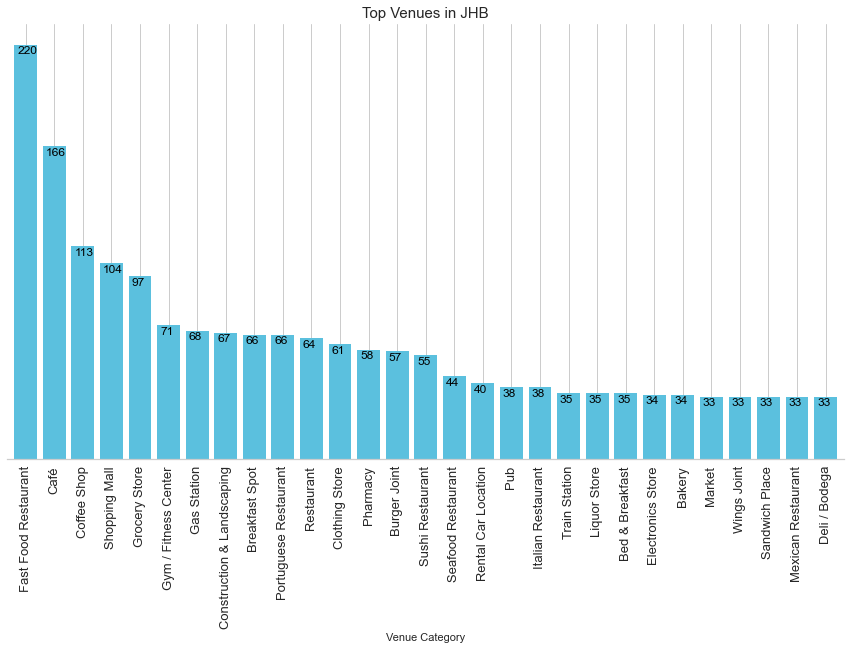

In [474]:
#top 10 venues overall in JHB:
ax = j_venues['Venue Category'].value_counts().head(29).sort_values(ascending = False).plot(kind='bar', figsize = (15, 8), width = 0.8, color = c)
plt.title('Top Venues in JHB', fontsize = 15)
plt.xlabel('Venue Category')
plt.ylabel('Count')
plt.xticks(fontsize = 13);

#plot count on bars:
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()+0.10, p.get_height()-5), fontsize=12, color='black')
    
#remove border lines from plot
ax.spines['right'].set_visible(False) 
ax.spines['top'].set_visible(False) 
ax.spines['left'].set_visible(False) 
plt.gca().axes.get_yaxis().set_visible(False)

In [530]:
j_venues.town.nunique() #only 22 suburbs

22

In [470]:
#boroughs with the most venues with > venues:
j_venues['town'].value_counts().rename_axis("Suburb").reset_index(name = 'Number of Venues')

,Suburb,Number of Venues
0,JOHANNESBURG,1221
1,EDENVALE,390
2,KEMPTON PARK,280
3,BENONI,155
4,BRYANSTON,134
5,SPRINGS,56
6,PIMVILLE,40
7,FLORIDA,40
8,TSAKANE,32
9,ALBERTON,27


In [535]:
j_venues.groupby(['town'])['Venue','Venue Category'].max()

C:\Users\hp\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Venue,Venue Category
town,,
ALBERTON,Rietvlei Dam,Park
BENONI,Woolworths,Seafood Restaurant
BROMHOF,Pick n Pay Family Cosmo City,Construction & Landscaping
BRYANSTON,iStore,Wings Joint
DALPARK,Ontime Readymix Concrete,Grocery Store
DUBE,SHAP Stadium,Stadium
EDENVALE,Woolworths,Supermarket
ELANDSFONTEIN,Edgars Alberton City,Clothing Store
ELDORADOPARK,Shoprite Centre Eldorado Park,Shopping Mall


In [539]:
#j_venues.groupby(['town', 'Venue Category'])['Venue'].count()

In [337]:
#save sample data:
j_venues.to_csv('joburg_venue_data_updated', index = False) #work with this dataset

#### Venues for London:

In [19]:
dfa = pd.read_csv('london_location_data')

In [20]:
dfa.head(2)

,location,borough,town,district,Latitude,Longitude
0,Abbey Wood,"Bexley, Greenwich",LONDON,SE2,51.4869,0.1075
1,Aldgate,City,LONDON,EC3,51.5085,-0.1257


In [21]:
#new df:
l_venues = getNearbyVenues(names=dfa['borough'],
                                   latitudes=dfa['Latitude'],
                                   longitudes=dfa['Longitude']
                                  )

Bexley, Greenwich 
City
Westminster
Bromley
Islington
Wandsworth
Southwark
Richmond upon Thames
Islington
Wandsworth
Westminster
Ealing
Westminster
Lewisham
Camden
Southwark
Tower Hamlets
City
Lewisham
Tower Hamlets
Camden
Tower Hamlets
Haringey
Brent
Lewisham
Tower Hamlets
Kensington and Chelsea, Hammersmith and Fulham
Brent
Barnet
Barnet
Southwark
Tower Hamlets
Camden
Tower Hamlets
Waltham Forest
Newham
Islington
Richmond upon Thames
Lewisham
Camden
Westminster
Greenwich
Kensington and Chelsea
Barnet
Westminster
Lewisham
Waltham Forest
Hounslow, Ealing, Hammersmith and Fulham
Brent
Barnet
Lambeth, Wandsworth
Islington
Barnet
Merton
Westminster
Barnet, Brent, Camden
Lewisham
Bexley
Haringey
Tower Hamlets
Newham
Hackney
Islington
Southwark
Lewisham
Brent
Southwark
Wandsworth
Southwark
Barnet
Newham
Richmond upon Thames
Greenwich
Islington, City
Islington
Haringey, Islington
Camden
Newham
Lewisham
Haringey
Barnet
Camden
Hammersmith and Fulham
Barnet
Barnet
Enfield
Greenwich
Hounslow
Lew

In [101]:
print('{} venues were returned by Foursquare.'.format(l_venues.shape[0]))

8411 venues were returned by Foursquare.


In [100]:
l_venues.sample(20)

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
7741,Kensington and Chelsea,51.4876,-0.169400,Proud Chelsea,51.487905,-0.167680,Art Gallery
7362,Tower Hamlets,51.5085,-0.125700,Dishoom,51.512383,-0.126949,Indian Restaurant
4618,Westminster,51.5156,-0.184580,Park Grand Paddington Court London,51.513552,-0.179752,Hotel
7223,Wandsworth,51.4307,-0.164700,Boom Bap Burgers,51.428994,-0.165840,Burger Joint
5978,Southwark,51.4935,-0.052800,Card Factory,51.495277,-0.046437,Gift Shop
1164,Tower Hamlets,51.5272,-0.055525,La Forchetta,51.527176,-0.057829,Pizza Place
4991,Greenwich,51.4506,0.054280,KFC,51.450549,0.055248,Fast Food Restaurant
1285,Islington,51.5354,-0.094400,The Life Centre Islington,51.538056,-0.099171,Yoga Studio
2680,"Haringey, Islington",51.5693,-0.106900,La Porchetta,51.569903,-0.113530,Pizza Place
7686,Tower Hamlets,51.5138,-0.061773,Ibis Budget Hotel,51.517655,-0.064794,Hotel


In [23]:
l_venues.shape

(8411, 7)

In [25]:
#save data:
l_venues.to_csv('london_venue_data', index = False)

In [94]:
#l_venues = pd.read_csv('london_venue_data')

In [ ]:
#### Now that we have the venues, the second step is to segment teh data to only include venues that are described as South African.

In [26]:
l_venues[l_venues['Venue Category'].str.contains("African")]

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1877,Islington,51.5262,-0.105518,Spinach & Agushi,51.525288,-0.110348,African Restaurant
2512,"Islington, City",51.5262,-0.105518,Spinach & Agushi,51.525288,-0.110348,African Restaurant
2612,Islington,51.5262,-0.105518,Spinach & Agushi,51.525288,-0.110348,African Restaurant
4602,Westminster,51.5156,-0.184580,Couscous Cafe,51.513730,-0.187969,African Restaurant
5466,Southwark,51.4740,-0.060325,Kudu,51.473889,-0.059369,African Restaurant
5647,Southwark,51.4740,-0.060325,Kudu,51.473889,-0.059369,African Restaurant
6882,Islington,51.5262,-0.105518,Spinach & Agushi,51.525288,-0.110348,African Restaurant
7506,Croydon,51.4193,-0.085075,Numidie Wine Bar and Bistro,51.419736,-0.080917,African Restaurant


In [27]:
l_venues[l_venues['Venue'].str.contains("South African")]

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category


In [102]:
#venue categories:

l_venues['Venue Category'].nunique()

281

In [103]:
l_venues['Venue'].nunique()

2614

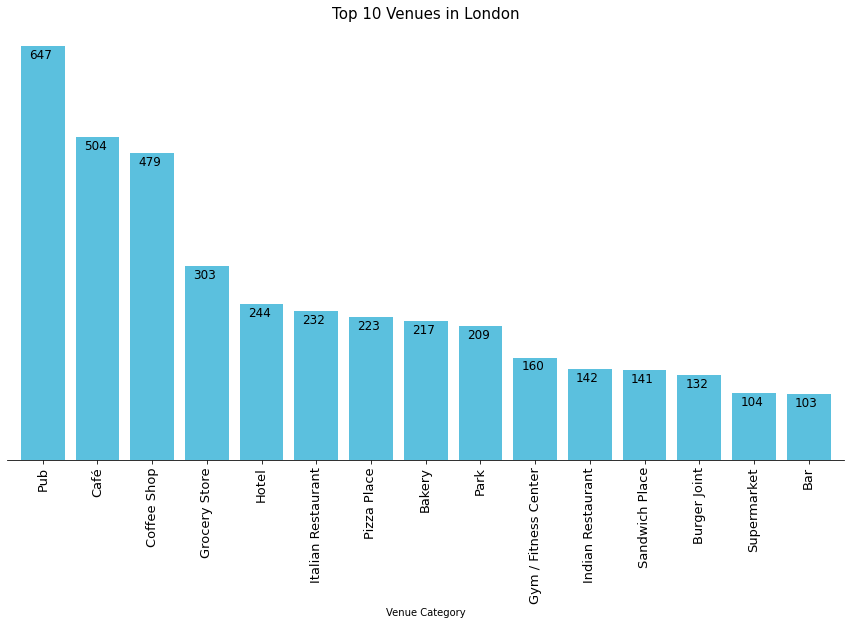

In [139]:
#top 10 venues overall in London:
ax = l_venues['Venue Category'].value_counts().head(15).sort_values(ascending = False).plot(kind='bar', figsize = (15, 8), width = 0.8, color = c)
plt.title('Top 15 Venues in London', fontsize = 15)
plt.xlabel('Venue Category')
plt.ylabel('Count')
plt.xticks(fontsize = 13);

#plot count on bars:
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()+0.15, p.get_height()-20), fontsize=12, color='black')
    
#remove border lines from plot
ax.spines['right'].set_visible(False) 
ax.spines['top'].set_visible(False) 
ax.spines['left'].set_visible(False) 
plt.gca().axes.get_yaxis().set_visible(False)
    

In [142]:
#number of neighbourhood:
l_venues.Neighbourhood.nunique()

44

In [145]:
#boroughs with the most venues with > venues:
l_venues['Neighbourhood'].value_counts().rename_axis("Borough").reset_index(name = 'Number of Venues')

,Borough,Number of Venues
0,Westminster,1490
1,Tower Hamlets,739
2,Islington,670
3,Camden,627
4,Hammersmith and Fulham,551
5,Hackney,447
6,Lewisham,331
7,Southwark,315
8,Greenwich,276
9,Haringey,267


In [256]:
#Most popular venues for each borough:
l_venues.groupby('Neighbourhood')['Venue Category'].max()

Neighbourhood
Barnet                                                                Wine Shop
Barnet, Brent, Camden                                           Warehouse Store
Bexley                                                               Playground
Bexley, Greenwich                                                    Playground
Brent                                                                 Wine Shop
Brent, Camden                                                         Wine Shop
Brent, Ealing                                                Spanish Restaurant
Brent, Harrow                                                        Steakhouse
Bromley                                                         Warehouse Store
Camden                                                              Zoo Exhibit
Camden, Islington                                 Vegetarian / Vegan Restaurant
City                                                                   Wine Bar
Croydon                   

In [258]:
ven = pd.DataFrame(l_venues.groupby(['Neighbourhood','Venue Category'])['Venue Category'].count().rename_axis(index = {"Neighborhood": "Borough", "Venue Category":"Venue"}).reset_index(name = 'Number of Venues'))

In [526]:
#ven.groupby('Neighbourhood')['Venue', 'Number of Venues'].max()

In [330]:
#ven[ven['Number of Venues'] == ven['Number of Venues'].max()]
ven.groupby(['Neighbourhood'])['Venue','Number of Venues'].max().sort_values(by = 'Number of Venues', ascending = False)

C:\Users\hp\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Venue,Number of Venues
Neighbourhood,,
Islington,Yoga Studio,101
Westminster,Wine Shop,88
Hackney,Yoga Studio,68
Camden,Zoo Exhibit,55
Tower Hamlets,Yoga Studio,49
Greenwich,Wine Shop,35
Hammersmith and Fulham,Wings Joint,35
Southwark,Xinjiang Restaurant,34
Haringey,Wine Bar,30


In [527]:
#group = l_venues.groupby('Neighbourhood')['Venue Category'].value_counts()
#l_venues.groupby(['Neighbourhood','Venue Category'])['Venue Category'].count()

In [528]:
#l_venues.groupby(['Neighbourhood','Venue Category']).idxmax()

### K-means Cluster Analysis:

#### Now that we have our venue data for London and Johannesburg, we can start prepping our data for our cluster analysis


- Preparing Joburg data:

In [404]:
j_s_venues = pd.read_csv('joburg_venue_data_sample')

In [405]:
j_s_venues.head()

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,JOHANNESBURG,-26.028779,27.924082,Pick n Pay Family Cosmo City,-26.031014,27.925282,Clothing Store
1,JOHANNESBURG,-26.094278,28.113482,Oria (Pty) Ltd,-26.097114,28.113418,Home Service
2,JOHANNESBURG,-26.094278,28.113482,Capital C'Z,-26.092140,28.115700,Clothing Store
3,JOHANNESBURG,-26.097485,27.938177,Barilla Sushi,-26.093657,27.940161,Sushi Restaurant
4,JOHANNESBURG,-26.097485,27.938177,Smooch,-26.096190,27.942900,Frozen Yogurt Shop


In [406]:
j_s_venues.shape

(2321, 7)

In [407]:
j_s_venues.Venue.nunique()

109

In [408]:
j_s_venues['Venue Category'].nunique()

62

In [435]:
#how many venues were returned for each neighborhood?
j_venues.groupby('Neighbourhood').count().sort_values(by = 'Venue Category', ascending = False)

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
JOHANNESBURG,1221,1221,1221,1221,1221,1221
EDENVALE,390,390,390,390,390,390
KEMPTON PARK,280,280,280,280,280,280
BENONI,155,155,155,155,155,155
BRYANSTON,134,134,134,134,134,134
SPRINGS,56,56,56,56,56,56
FLORIDA,40,40,40,40,40,40
PIMVILLE,40,40,40,40,40,40
TSAKANE,32,32,32,32,32,32


In [391]:
#how many unique categories can be curated from all the returned venues?
print('There are {} uniques categories.'.format(len(j_s_venues['Venue Category'].unique())))

There are 62 uniques categories.


In [437]:
#change neighbourhood to name 'town' as these are towns and not neighbourhoods:
j_venues.rename(columns = {'Neighbourhood': 'town'}, inplace = True)

In [364]:
j_s_venues.head(1)

,town,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,JOHANNESBURG,-26.148235,28.097601,Genesis,-26.14752,28.099282,Shopping Mall


**Analyze Each Neighbourhood**

In [438]:
# one hot encoding
j_onehot = pd.get_dummies(j_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
j_onehot['town'] = j_venues['town'] 

# move neighborhood column to the first column
fixed_columns = [j_onehot.columns[-1]] + list(j_onehot.columns[:-1])
j_onehot = j_onehot[fixed_columns]

j_onehot.head()

,town,African Restaurant,American Restaurant,Arcade,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Workshop,BBQ Joint,Bakery,...,Shop & Service,Shopping Mall,Soccer Field,Sports Bar,Stadium,Supermarket,Sushi Restaurant,Tea Room,Train Station,Wings Joint
0,JEPPESTOWN,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,JEPPESTOWN,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,JEPPESTOWN,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,JEPPESTOWN,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,ELDORADOPARK,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [439]:
#new df size:
j_onehot.shape

(2489, 75)

In [440]:
#columns:
j_onehot.columns

Index(['town', 'African Restaurant', 'American Restaurant', 'Arcade',
       'Asian Restaurant', 'Athletics & Sports', 'Auto Dealership',
       'Auto Workshop', 'BBQ Joint', 'Bakery', 'Bar', 'Bed & Breakfast',
       'Breakfast Spot', 'Burger Joint', 'Café', 'Chinese Restaurant',
       'Clothing Store', 'Coffee Shop', 'Concert Hall',
       'Construction & Landscaping', 'Convenience Store', 'Cosmetics Shop',
       'Cupcake Shop', 'Deli / Bodega', 'Department Store',
       'Electronics Store', 'Farmers Market', 'Fast Food Restaurant',
       'Fish Market', 'Food & Drink Shop', 'Fried Chicken Joint',
       'Frozen Yogurt Shop', 'Fruit & Vegetable Store', 'Gas Station',
       'Golf Course', 'Grocery Store', 'Gym', 'Gym / Fitness Center',
       'Heliport', 'Home Service', 'Hotel', 'Ice Cream Shop',
       'Indian Restaurant', 'Italian Restaurant', 'Japanese Restaurant',
       'Lake', 'Liquor Store', 'Market', 'Mediterranean Restaurant',
       'Mexican Restaurant', 'Multiplex', 'Mu

**Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.**

In [441]:
j_grouped = j_onehot.groupby('town').mean().reset_index()
j_grouped.head()

,town,African Restaurant,American Restaurant,Arcade,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Workshop,BBQ Joint,Bakery,...,Shop & Service,Shopping Mall,Soccer Field,Sports Bar,Stadium,Supermarket,Sushi Restaurant,Tea Room,Train Station,Wings Joint
0,ALBERTON,0.0,0.0,0.259259,0.0,0.0,0.0,0.0,0.111111,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
1,BENONI,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
2,BROMHOF,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
3,BRYANSTON,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.029851,...,0.0,0.0,0.0,0.0,0.0,0.0,0.052239,0.0,0.0,0.052239
4,DALPARK,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000


In [442]:
#new df size:
j_grouped.shape

(22, 75)

**Print each neighborhood along with the top 5 most common venues**

In [370]:
num_top_venues = 5

for hood in j_grouped['town']:
    print("----"+hood+"----")
    temp = j_grouped[j_grouped['town'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')



----ALBERTON----
                venue  freq
0                Park   0.4
1              Arcade   0.2
2                Lake   0.2
3           BBQ Joint   0.2
4  African Restaurant   0.0


----BENONI----
                   venue  freq
0  Portuguese Restaurant   0.1
1     Italian Restaurant   0.1
2          Grocery Store   0.1
3                 Lawyer   0.1
4        Automotive Shop   0.1


----BROMHOF----
                      venue  freq
0            Clothing Store   1.0
1        African Restaurant   0.0
2  Mediterranean Restaurant   0.0
3               Pizza Place   0.0
4                  Pharmacy   0.0


----BRYANSTON----
                  venue  freq
0                  Café  0.16
1  Fast Food Restaurant  0.08
2           Wings Joint  0.05
3             Cafeteria  0.05
4                Market  0.05


----DALPARK----
                        venue  freq
0  Construction & Landscaping   0.6
1                 Pizza Place   0.2
2               Grocery Store   0.2
3         Martial Arts Schoo

**Put the above data into a pd df**

In [371]:
#write a function to sort the venues in descending order.:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [443]:
#create the new dataframe and display the top 10 venues for each neighborhood.:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['town']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
j_venues_sorted = pd.DataFrame(columns=columns)
j_venues_sorted['town'] = j_grouped['town']

for ind in np.arange(j_grouped.shape[0]):
    j_venues_sorted.iloc[ind, 1:] = return_most_common_venues(j_grouped.iloc[ind, :], num_top_venues)

j_venues_sorted.head()

,town,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALBERTON,Park,Lake,Arcade,BBQ Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
1,BENONI,Portuguese Restaurant,Seafood Restaurant,Burger Joint,Breakfast Spot,Grocery Store,Athletics & Sports,Convenience Store,Golf Course,Gas Station,Fruit & Vegetable Store
2,BROMHOF,Clothing Store,Construction & Landscaping,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
3,BRYANSTON,Café,Fast Food Restaurant,Wings Joint,Sandwich Place,Deli / Bodega,Gas Station,Golf Course,Grocery Store,Market,Mexican Restaurant
4,DALPARK,Construction & Landscaping,Grocery Store,Fried Chicken Joint,Wings Joint,Farmers Market,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store


- Preparing London data

In [481]:
l_venues.head()

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Bexley, Greenwich",51.4869,0.1075,Co-op Food,51.487650,0.113490,Grocery Store
1,"Bexley, Greenwich",51.4869,0.1075,Bostal Gardens,51.486670,0.110462,Playground
2,"Bexley, Greenwich",51.4869,0.1075,Meghna Tandoori,51.485709,0.101681,Indian Restaurant
3,City,51.5085,-0.1257,National Gallery,51.508876,-0.128478,Art Museum
4,City,51.5085,-0.1257,Gordon's Wine Bar,51.507911,-0.123293,Wine Bar


In [482]:
#how many venues were returned for each neighborhood?
l_venues.groupby('Neighbourhood').count().sort_values(by = 'Venue Category', ascending = False)

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Westminster,1490,1490,1490,1490,1490,1490
Tower Hamlets,739,739,739,739,739,739
Islington,670,670,670,670,670,670
Camden,627,627,627,627,627,627
Hammersmith and Fulham,551,551,551,551,551,551
Hackney,447,447,447,447,447,447
Lewisham,331,331,331,331,331,331
Southwark,315,315,315,315,315,315
Greenwich,276,276,276,276,276,276


In [165]:
#how many unique categories can be curated from all the returned venues?
print('There are {} uniques categories.'.format(len(l_venues['Venue Category'].unique())))

There are 281 uniques categories.


**Analyze Each Neighborhood**

In [483]:
# one hot encoding
l_onehot = pd.get_dummies(l_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
l_onehot['Neighbourhood'] = l_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [l_onehot.columns[-1]] + list(l_onehot.columns[:-1])
l_onehot = l_onehot[fixed_columns]

l_onehot.head()

,Neighbourhood,African Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,...,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo Exhibit
0,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,City,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,City,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [484]:
#new df size:
l_onehot.shape

(8411, 282)

In [168]:
#columns:
l_onehot.columns

Index(['Neighbourhood', 'African Restaurant', 'American Restaurant',
       'Antique Shop', 'Arepa Restaurant', 'Argentinian Restaurant',
       'Art Gallery', 'Art Museum', 'Arts & Crafts Store',
       'Arts & Entertainment',
       ...
       'Video Game Store', 'Vietnamese Restaurant', 'Warehouse Store',
       'Wine Bar', 'Wine Shop', 'Wings Joint', 'Women's Store',
       'Xinjiang Restaurant', 'Yoga Studio', 'Zoo Exhibit'],
      dtype='object', length=282)

**Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.**

In [485]:
l_grouped = l_onehot.groupby('Neighbourhood').mean().reset_index()
l_grouped.head()

,Neighbourhood,African Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,...,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo Exhibit
0,Barnet,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.004587,0.0,...,0.0,0.004587,0.004587,0.0,0.009174,0.0,0.0,0.0,0.0,0.0
1,"Barnet, Brent, Camden",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111111,0.0,...,0.0,0.000000,0.111111,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
2,Bexley,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
3,"Bexley, Greenwich",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
4,Brent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020690,0.0,...,0.0,0.027586,0.006897,0.0,0.013793,0.0,0.0,0.0,0.0,0.0


In [486]:
l_grouped.shape

(44, 282)

In [487]:
#create the new dataframe and display the top 10 venues for each neighborhood.:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
l_venues_sorted = pd.DataFrame(columns=columns)
l_venues_sorted['Neighbourhood'] = l_grouped['Neighbourhood']

for ind in np.arange(l_grouped.shape[0]):
    l_venues_sorted.iloc[ind, 1:] = return_most_common_venues(l_grouped.iloc[ind, :], num_top_venues)

l_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barnet,Café,Grocery Store,Park,Pub,Indian Restaurant,Bakery,Golf Course,Italian Restaurant,Coffee Shop,Clothing Store
1,"Barnet, Brent, Camden",Chinese Restaurant,Grocery Store,Sporting Goods Shop,Warehouse Store,Supermarket,Arts & Crafts Store,Clothing Store,Hardware Store,Farm,Ethiopian Restaurant
2,Bexley,Grocery Store,Indian Restaurant,Playground,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
3,"Bexley, Greenwich",Grocery Store,Indian Restaurant,Playground,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
4,Brent,Café,Coffee Shop,Pub,Platform,Lighting Store,Spanish Restaurant,Fast Food Restaurant,Brazilian Restaurant,Gastropub,Vietnamese Restaurant


### Building the model for Joburg and London venues.

- Run k-means to cluster the neighborhood into n clusters.

**Johannesburg Venues Cluster:**

In [279]:
#!pip install yellowbrick

- Determining the best k for our model:
      - This is done in order to determine the optimal number of clusters into which the data may be clustered.
        - The elbow methid will be used as it's one of the most common analystical approaches to test k means models.

In [374]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

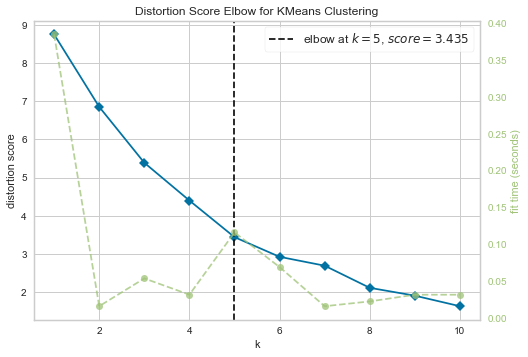

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [450]:
#with sample 500 data
j_test_cluster = j_grouped.drop('town', 1)

model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,11))

visualizer.fit(j_test_cluster)        
visualizer.poof()   

In [451]:
#set number of clusters
kclusters = 5

j_grouped_clustering = j_grouped.drop('town', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(j_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 1, 0, 1, 0, 0, 2, 0, 4])

In [453]:
#change neighbourhood to name 'town' as these are towns and not neighbourhoods:
samp_j.rename(columns = {'suburb': 'town'}, inplace = True)

In [454]:
samp_j.head(1)

,Place Name,Street Code,PO Box Code,town,City,Province,Latitude,Longitude
1365,GEORGE COCH HOSTEL,2094,NaN,JEPPESTOWN,JOHANNESBURG,Gauteng,-26.198395,28.086503


In [455]:
# add clustering labels
j_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

j_merged = samp_j

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
j_merged = j_merged.join(j_venues_sorted.set_index('town'), on='town')

j_merged.head() # check the last columns!

,Place Name,Street Code,PO Box Code,town,City,Province,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1365,GEORGE COCH HOSTEL,2094,NaN,JEPPESTOWN,JOHANNESBURG,Gauteng,-26.198395,28.086503,0.0,Bar,Scenic Lookout,Home Service,Hotel,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
1109,ELDORADOPARK EXT 7,1811,NaN,ELDORADOPARK,JOHANNESBURG,Gauteng,-26.295055,27.903608,0.0,Portuguese Restaurant,Shopping Mall,Concert Hall,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
2412,ODIN PARK EXT 9,1830,NaN,LENASIA,JOHANNESBURG,Gauteng,-26.381617,27.812835,0.0,Indian Restaurant,Pharmacy,Fast Food Restaurant,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
3697,WELTEVREDENPARK UIT 2,1709,NaN,FLORIDA,JOHANNESBURG,Gauteng,-26.163893,27.920800,4.0,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
725,DALPARK EXT 9,1541,1552.0,DALPARK,JOHANNESBURG,Gauteng,-26.032765,28.173136,1.0,Construction & Landscaping,Grocery Store,Fried Chicken Joint,Wings Joint,Farmers Market,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store


In [456]:
j_merged['Cluster Labels'].isna().sum()

120

In [457]:
#drop nans:
j_merged.dropna(subset = ['Cluster Labels'], axis = 0, inplace = True)

In [458]:
#turn cluster labels into int not float:
j_merged['Cluster Labels'] = j_merged['Cluster Labels'].astype(int)

In [479]:
j_merged.sample(10)[['town', 'Cluster Labels', '1st Most Common Venue', '1st Most Common Venue', '2nd Most Common Venue', '3rd Most Common Venue', '4th Most Common Venue', '5th Most Common Venue', '6th Most Common Venue', '7th Most Common Venue', '8th Most Common Venue', '9th Most Common Venue', '10th Most Common Venue']]

,town,Cluster Labels,1st Most Common Venue,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2924,JOHANNESBURG,0,Café,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
3370,GERMISTON,1,Construction & Landscaping,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
3472,TEMBISA,2,Clothing Store,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market
3774,JOHANNESBURG,0,Café,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
1961,JOHANNESBURG,0,Café,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
2004,FLORIDA,4,Rental Car Location,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
2506,JOHANNESBURG,0,Café,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
3032,JOHANNESBURG,0,Café,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
3135,TSAKANE,1,Construction & Landscaping,Construction & Landscaping,Grocery Store,Fried Chicken Joint,Wings Joint,Farmers Market,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
1040,EDENVALE,0,Fast Food Restaurant,Fast Food Restaurant,Café,Coffee Shop,Supermarket,Clothing Store,Shopping Mall,Burger Joint,Convenience Store,Mediterranean Restaurant,Multiplex


**Visualize the resulting clusters**

In [459]:
jlat = -26.205
jlong = 28.049722

In [460]:
# create map
joburg_map_clusters = folium.Map(location=[jlat, jlong], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(j_merged['Latitude'], j_merged['Longitude'], j_merged['town'], j_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(joburg_map_clusters)
       
joburg_map_clusters

#### Examine Johannesbutg Clusters:

- Cluster 1

In [461]:
j_merged.head(1)

,Place Name,Street Code,PO Box Code,town,City,Province,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1365,GEORGE COCH HOSTEL,2094,NaN,JEPPESTOWN,JOHANNESBURG,Gauteng,-26.198395,28.086503,0,Bar,Scenic Lookout,Home Service,Hotel,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market


In [513]:
#drop columns:
j_merged.drop(j_merged.columns[[0, 1, 2, 4, 5, 6, 7]], axis = 1, inplace = True)

In [516]:
j_merged.loc[j_merged['Cluster Labels'] == 0, j_merged.columns[[0] + list(range(1, j_merged.shape[1]))]]

,town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1365,JEPPESTOWN,0,Bar,Scenic Lookout,Home Service,Hotel,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
1109,ELDORADOPARK,0,Portuguese Restaurant,Shopping Mall,Concert Hall,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
2412,LENASIA,0,Indian Restaurant,Pharmacy,Fast Food Restaurant,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
1402,JOHANNESBURG,0,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
2258,SPRINGS,0,Shopping Mall,Auto Dealership,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
2814,JOHANNESBURG,0,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
467,JOHANNESBURG,0,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
3422,JOHANNESBURG,0,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
1242,JOHANNESBURG,0,Café,Fast Food Restaurant,Grocery Store,Sushi Restaurant,Coffee Shop,Restaurant,Pharmacy,Italian Restaurant,Liquor Store,Gym / Fitness Center
2599,PIMVILLE,0,Fast Food Restaurant,Bar,Café,Shopping Mall,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market


- Cluster 2

In [517]:
j_merged.loc[j_merged['Cluster Labels'] == 1, j_merged.columns[[0] + list(range(1, j_merged.shape[1]))]]

,town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
725,DALPARK,1,Construction & Landscaping,Grocery Store,Fried Chicken Joint,Wings Joint,Farmers Market,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
3463,TSAKANE,1,Construction & Landscaping,Grocery Store,Fried Chicken Joint,Wings Joint,Farmers Market,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
2616,GERMISTON,1,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
1373,GERMISTON,1,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
166,GERMISTON,1,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
1760,GERMISTON,1,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
699,GERMISTON,1,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
3841,TSAKANE,1,Construction & Landscaping,Grocery Store,Fried Chicken Joint,Wings Joint,Farmers Market,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
1785,GERMISTON,1,Construction & Landscaping,Wings Joint,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market
1724,MIDRAND,1,Heliport,Construction & Landscaping,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fast Food Restaurant,Fish Market


- Cluster 3

In [518]:
j_merged.loc[j_merged['Cluster Labels'] == 2, j_merged.columns[[0] + list(range(1, j_merged.shape[1]))]]

,town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2059,MEADOWLANDS,2,Clothing Store,Concert Hall,Bar,Music Venue,Home Service,Stadium,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
2071,MEADOWLANDS,2,Clothing Store,Concert Hall,Bar,Music Venue,Home Service,Stadium,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
2058,MEADOWLANDS,2,Clothing Store,Concert Hall,Bar,Music Venue,Home Service,Stadium,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
1571,TEMBISA,2,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market
3472,TEMBISA,2,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market
1615,TEMBISA,2,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market
2082,MEADOWLANDS,2,Clothing Store,Concert Hall,Bar,Music Venue,Home Service,Stadium,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store
3508,TEMBISA,2,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market
3387,TEMBISA,2,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market
3473,TEMBISA,2,Clothing Store,Wings Joint,Fast Food Restaurant,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market,Fish Market


- Cluster 4

In [519]:
j_merged.loc[j_merged['Cluster Labels'] == 3, j_merged.columns[[0] + list(range(1, j_merged.shape[1]))]]

,town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2489,ORLANDO,3,Soccer Field,Wings Joint,Fast Food Restaurant,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
2479,ORLANDO,3,Soccer Field,Wings Joint,Fast Food Restaurant,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
2485,ORLANDO,3,Soccer Field,Wings Joint,Fast Food Restaurant,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market
2488,ORLANDO,3,Soccer Field,Wings Joint,Fast Food Restaurant,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Farmers Market


- Cluster 5

In [520]:
j_merged.loc[j_merged['Cluster Labels'] == 4, j_merged.columns[[0] + list(range(1, j_merged.shape[1]))]]

,town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3697,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
3132,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
82,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
85,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
3672,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
1293,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
3710,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
820,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
3657,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant
2004,FLORIDA,4,Rental Car Location,Wings Joint,Farmers Market,Convenience Store,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Department Store,Electronics Store,Fast Food Restaurant


In [ ]:
- Cluster 6

In [467]:
#j_merged.loc[j_merged['Cluster Labels'] == 5, j_merged.columns[[3] + list(range(5, j_merged.shape[1]))]]

In [ ]:
- Cluster 7

In [468]:
#j_merged.loc[j_merged['Cluster Labels'] == 6, j_merged.columns[[3] + list(range(5, j_merged.shape[1]))]]

--------------------------------------------------

**London Venues Cluster:**

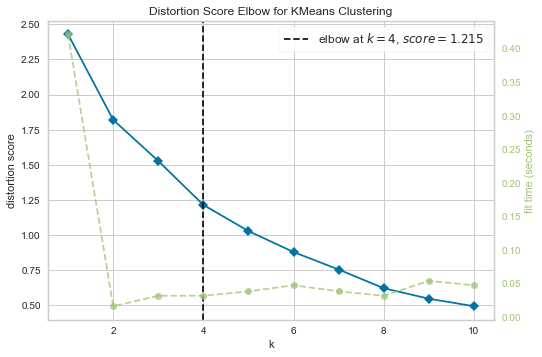

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [512]:
j_test_cluster = l_grouped.drop('Neighbourhood', 1)

model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,11))

visualizer.fit(j_test_cluster)        
visualizer.poof()   

In [496]:
#set number of clusters
kclusters = 4

l_grouped_clustering = l_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(l_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 2, 2, 0, 0, 0, 1, 0, 0])

**Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.**

In [497]:
dfa.head(1)

,location,borough,town,district,Latitude,Longitude
0,Abbey Wood,"Bexley, Greenwich",LONDON,SE2,51.4869,0.1075


In [498]:
# add clustering labels
l_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

l_merged = dfa

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
l_merged = l_merged.join(l_venues_sorted.set_index('Neighbourhood'), on='borough')

l_merged.head() # check the last columns!

,location,borough,town,district,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,"Bexley, Greenwich",LONDON,SE2,51.4869,0.107500,2,Grocery Store,Indian Restaurant,Playground,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
1,Aldgate,City,LONDON,EC3,51.5085,-0.125700,0,Theater,Hotel,Burger Joint,Plaza,Cocktail Bar,Bakery,Steakhouse,Ice Cream Shop,Coffee Shop,Café
2,Aldwych,Westminster,LONDON,WC2,51.5142,-0.123382,0,Hotel,Coffee Shop,Pub,Italian Restaurant,Café,Sandwich Place,Bakery,Gym / Fitness Center,Theater,Pizza Place
3,Anerley,Bromley,LONDON,SE20,51.4065,-0.056950,0,Fast Food Restaurant,Supermarket,Grocery Store,Pub,Train Station,Tram Station,Gastropub,Convenience Store,Mediterranean Restaurant,Pharmacy
4,Archway,Islington,LONDON,N19,51.5649,-0.135100,0,Pub,Café,Coffee Shop,Park,Grocery Store,Italian Restaurant,Cocktail Bar,Pizza Place,Gym / Fitness Center,Bar


In [499]:
l_merged.sample(10)[['borough', 'Cluster Labels', '1st Most Common Venue', '1st Most Common Venue', '2nd Most Common Venue', '3rd Most Common Venue', '4th Most Common Venue', '5th Most Common Venue', '6th Most Common Venue', '7th Most Common Venue', '8th Most Common Venue', '9th Most Common Venue', '10th Most Common Venue']]

,borough,Cluster Labels,1st Most Common Venue,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
174,Tower Hamlets,0,Pub,Pub,Hotel,Coffee Shop,Indian Restaurant,Pizza Place,Grocery Store,Burger Joint,Park,Sandwich Place,Steakhouse
53,Merton,0,Café,Café,Clothing Store,Burger Joint,Italian Restaurant,Gym,Restaurant,Sushi Restaurant,Bar,Thai Restaurant,Theater
182,Croydon,0,Platform,Platform,Coffee Shop,Café,Pub,Italian Restaurant,Pizza Place,Gastropub,Sports Bar,Gym / Fitness Center,Supermarket
116,Kensington and Chelsea,0,Bakery,Bakery,Italian Restaurant,Hotel,Café,Pub,Ice Cream Shop,Exhibit,Coffee Shop,Burger Joint,English Restaurant
161,Tower Hamlets,0,Pub,Pub,Hotel,Coffee Shop,Indian Restaurant,Pizza Place,Grocery Store,Burger Joint,Park,Sandwich Place,Steakhouse
129,Lewisham,0,Grocery Store,Grocery Store,Café,Coffee Shop,Pub,Convenience Store,Clothing Store,Bus Stop,Fish & Chips Shop,Gastropub,Supermarket
112,Barnet,0,Café,Café,Grocery Store,Park,Pub,Indian Restaurant,Bakery,Golf Course,Italian Restaurant,Coffee Shop,Clothing Store
244,Hammersmith and Fulham,0,Coffee Shop,Coffee Shop,Pub,Grocery Store,Clothing Store,Hotel,Café,Gym / Fitness Center,Bakery,Burger Joint,Chinese Restaurant
108,Lewisham,0,Grocery Store,Grocery Store,Café,Coffee Shop,Pub,Convenience Store,Clothing Store,Bus Stop,Fish & Chips Shop,Gastropub,Supermarket
45,Lewisham,0,Grocery Store,Grocery Store,Café,Coffee Shop,Pub,Convenience Store,Clothing Store,Bus Stop,Fish & Chips Shop,Gastropub,Supermarket


In [500]:
#rename borough to neighbourhood:
l_merged.rename(columns = {'borough': 'Neighbourhood'}, inplace = True)

**Visualize the resulting clusters.**

In [501]:
lon_lat = 51.5073219
lon_long = -0.1276474

In [502]:
# create map
london_map_clusters = folium.Map(location=[lon_lat, lon_long], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(l_merged['Latitude'], l_merged['Longitude'], l_merged['Neighbourhood'], l_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(london_map_clusters)
       
london_map_clusters

#### Examine Clusters

In [521]:
#drop columns:
l_merged.drop(l_merged.columns[[1]], axis = 1, inplace = True)

- Cluster 1

In [523]:
l_merged.loc[l_merged['Cluster Labels'] == 0, l_merged.columns[[0] + list(range(5, l_merged.shape[1]))]]

,location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Aldgate,0,Theater,Hotel,Burger Joint,Plaza,Cocktail Bar,Bakery,Steakhouse,Ice Cream Shop,Coffee Shop,Café
2,Aldwych,0,Hotel,Coffee Shop,Pub,Italian Restaurant,Café,Sandwich Place,Bakery,Gym / Fitness Center,Theater,Pizza Place
3,Anerley,0,Fast Food Restaurant,Supermarket,Grocery Store,Pub,Train Station,Tram Station,Gastropub,Convenience Store,Mediterranean Restaurant,Pharmacy
4,Archway,0,Pub,Café,Coffee Shop,Park,Grocery Store,Italian Restaurant,Cocktail Bar,Pizza Place,Gym / Fitness Center,Bar
5,Balham,0,Pub,Indian Restaurant,Bar,Supermarket,Portuguese Restaurant,Burger Joint,Grocery Store,Park,Fish & Chips Shop,Coffee Shop
6,Bankside,0,Pub,Bus Stop,Park,Café,Grocery Store,Coffee Shop,Pizza Place,Pharmacy,Gym / Fitness Center,Beer Bar
7,Barnes,0,Pub,Grocery Store,Coffee Shop,Pizza Place,Farmers Market,Park,Café,Italian Restaurant,Chinese Restaurant,Gastropub
8,Barnsbury,0,Pub,Café,Coffee Shop,Park,Grocery Store,Italian Restaurant,Cocktail Bar,Pizza Place,Gym / Fitness Center,Bar
9,Battersea,0,Pub,Indian Restaurant,Bar,Supermarket,Portuguese Restaurant,Burger Joint,Grocery Store,Park,Fish & Chips Shop,Coffee Shop
10,Bayswater,0,Hotel,Coffee Shop,Pub,Italian Restaurant,Café,Sandwich Place,Bakery,Gym / Fitness Center,Theater,Pizza Place


- Cluster 2

In [524]:
l_merged.loc[l_merged['Cluster Labels'] == 1, l_merged.columns[[0] + list(range(5, l_merged.shape[1]))]]

,location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
118,Kenton,1,Steakhouse,Fish & Chips Shop,Pharmacy,Film Studio,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant


- Cluster 3

In [506]:
l_merged.loc[l_merged['Cluster Labels'] == 2, l_merged.columns[[1] + list(range(5, l_merged.shape[1]))]]

,Neighbourhood,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Bexley, Greenwich",0.1075,2,Grocery Store,Indian Restaurant,Playground,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
57,Bexley,0.1075,2,Grocery Store,Indian Restaurant,Playground,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
237,Bexley,0.1075,2,Grocery Store,Indian Restaurant,Playground,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market


- Cluster 4

In [507]:
l_merged.loc[l_merged['Cluster Labels'] == 3, l_merged.columns[[1] + list(range(5, l_merged.shape[1]))]]

,Neighbourhood,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
109,"Greenwich, Lewisham",0.0209,3,Fast Food Restaurant,Pub,Park,Bus Stop,Zoo Exhibit,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
